# **Group Assignment** - Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season 1:winter, 2:spring, 3:summer, 4:fall
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

## PART I: Exploratory Data Analysis

In [1]:
import pandas as pd 

data = pd.read_csv('bike-sharing-hourly.csv')
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [2]:
data.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [3]:
data['dteday']

0        2011-01-01
1        2011-01-01
2        2011-01-01
3        2011-01-01
4        2011-01-01
            ...    
17374    2012-12-31
17375    2012-12-31
17376    2012-12-31
17377    2012-12-31
17378    2012-12-31
Name: dteday, Length: 17379, dtype: object

In [4]:
# we want to convert the date column to a datetime object
data['dteday'] = pd.to_datetime(data['dteday'])

In [5]:
data.dtypes

instant                int64
dteday        datetime64[ns]
season                 int64
yr                     int64
mnth                   int64
hr                     int64
holiday                int64
weekday                int64
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object

Other column considerations:

Consider these when encoding these columns, need to make sure we don't imply hierarchy with OneHotEncoding

- season is categorical 
- mnth is categorical 
- weathersit is categorical 

In [6]:
# checking that mnth column only contains values 1 to 12
data['mnth'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [7]:
# checking that the hr column only contains values 0 to 23
data['hr'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [8]:
# checking that the weekday column only contains values 0 to 6
sorted(data['weekday'].unique())

[0, 1, 2, 3, 4, 5, 6]

In [9]:
data.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


### Checking Missing Values

In [10]:
# checking for missing values
print(f"Number of missing values per col:\n{data.isnull().sum()}")

Number of missing values per col:
instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64


### Checking Duplicates

In [11]:
# checking for duplicates 
print(f"Number of duplicates: {data.duplicated().sum()}")

Number of duplicates: 0


### Checking Outliers

In [12]:
# function to check for outliers in the data 
def detect_outliers(data, threshold=3):
    outliers = []
    mean = data.mean()
    std = data.std()
    for i in data:
        z_score = (i - mean) / std
        if abs(z_score) > threshold:
            outliers.append(i)
    return outliers

# want to check the columns only with intelligible data types 
outliers_check = data.select_dtypes(include=['int64', 'float64'])

# setting up a df to display outlier counts, putting 0 if None
df_outliers = pd.DataFrame()
for col in outliers_check.columns:
    outliers = detect_outliers(data[col])
    if len(outliers) > 0:
        df_outliers[col] = [len(outliers)]
    else:
        df_outliers[col] = [0]

# transpose the df to make it easier to read
df_outliers = df_outliers.T
#rename columns of df 
df_outliers.columns = ['Outlier Count']
df_outliers 


,Outlier Count
instant,0
season,0
yr,0
mnth,0
hr,0
holiday,500
weekday,0
workingday,0
weathersit,3
temp,0


We see that columns have outliers according to being 3 standard deviations away from the mean for those columns. How do we manage these values?

In [13]:
# checking outliers for holiday 
data['holiday'].value_counts()

0    16879
1      500
Name: holiday, dtype: int64

In [14]:
# checking for outliers in each column where df_outliers has value > 0
for col in df_outliers.index:
    if df_outliers.loc[col, 'Outlier Count'] > 0:
        print(col)
        # print counts for different outliers per column with outliers
        outliers_col = detect_outliers(data[col])
        # convert outliers_col so we can get value counts
        outliers_col = pd.Series(outliers_col)
        print(outliers_col.value_counts())
        print('\n')

holiday
1    500
dtype: int64


weathersit
4    3
dtype: int64


atemp
1.0    1
dtype: int64


hum
0.0    22
dtype: int64


windspeed
0.5821    44
0.6119    23
0.6418    14
0.6567    11
0.6866     5
0.7463     2
0.8060     2
0.8507     2
0.7164     2
0.7761     1
0.8358     1
dtype: int64


casual
191    13
195    12
240    11
186    11
187    10
       ..
332     1
361     1
356     1
331     1
304     1
Length: 138, dtype: int64


registered
670    6
642    6
719    5
652    5
697    5
      ..
810    1
723    1
768    1
689    1
666    1
Length: 177, dtype: int64


cnt
812    6
750    6
743    5
785    4
808    4
      ..
767    1
865    1
739    1
913    1
963    1
Length: 143, dtype: int64




We need to decide how to handle these outliers for specific columns.

- holiday: weather day is holiday or not
    - Makes no sense to drop outliers, keep them because it represents that the day is a holiday

- weathersit: categorical variable
    - Makes no sense to drop outliers

- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
    - <b>Not sure what to do here</b>
    - This would mean 50 degrees celsius, outlier but keep it because feeling temp

- hum: Normalized humidity. The values are divided to 100 (max)
    - <b>Not sure what to do here</b>
    - Values are all 0, this means no humidity - makes sense to keep it?

- windspeed: Normalized windspeed. The values are divided to 67 (max)
    - many values in the decimals, the outliers are in the higher half of the decimals from 0.5821 to 0.8358
    - Keep

- casual: count of casual users
    - outliers are high values, maybe makes sense to have some of these 

- registered: count of registered users 
    - outliers are high values, maybe makes sense to have some of these 

- cnt of total rental bikes including both casual and registered
    - aggregation of casual and registered, make sure data quality
    - it is the sum for these cols, data is good

In [15]:
# seeing the whole record where the atemp is 50 
data[data['atemp'] == 1.0]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
4768,4769,2011-07-22,3,0,7,14,0,5,1,1,0.96,1.0,0.48,0.2985,24,77,101


In [16]:
# making sure the column called cnt is the sum of the casual and registered values for each row 
# creating a dummy col to check this
data['cnt_check'] = data['casual'] + data['registered']

# checking to see if the cnt column aligns with the sum of casual and registered
num_correct = 0
for i in range(len(data)):
    if data['cnt'][i] != data['cnt_check'][i]:
        print('mismatch at index', i)
    else:
        num_correct += 1 
print('all correct:', num_correct == len(data))

all correct: True


In [17]:
data['windspeed'].value_counts()

0.0000    2180
0.1343    1738
0.1642    1695
0.1940    1657
0.1045    1617
0.2239    1513
0.0896    1425
0.2537    1295
0.2836    1048
0.2985     808
0.3284     602
0.3582     460
0.3881     381
0.4179     296
0.4478     176
0.4627     146
0.4925     112
0.5224      84
0.5821      44
0.5522      39
0.6119      23
0.6418      14
0.6567      11
0.6866       5
0.7463       2
0.8060       2
0.8507       2
0.7164       2
0.7761       1
0.8358       1
Name: windspeed, dtype: int64

In [18]:
# plotting specific columns to see how the outliers compare 
cols = ['atemp', 'hum', 'windspeed']

# using plotly
import plotly.express as px
import seaborn as sns

# plotting histogram for each
for col in cols:
    fig = px.histogram(data, x=col, title=f'{col} histogram')
    fig.show()

We see there is skewedness in these distributions due to the outliers.

However, they don't seem to be "bad values." They could influence the bike rental patterns.

#### We decide not to do anything with the outliers because we believe they hold necessary and non-erroneous information.

---

# Data Visualization

In [19]:
# 1. Seasonal Trends
seasonal_trends = data.groupby('season')['cnt'].mean().reset_index()
# renaming the season column to make it more readable
season_names = {
    1: 'Clear',
    2: 'Misty',
    3: 'Light Precipitation',
    4: 'Heavy Precipitation'
}
seasonal_trends['season'] = seasonal_trends['season'].map(season_names)
fig1 = px.bar(seasonal_trends, x='season', y='cnt', labels={'cnt': 'Average Rental Count'}, 
              title='Average Rental Count by Season')
# sort the x-axis by the most to least 
fig1.update_xaxes(categoryorder='total descending')
fig1.show()

In [20]:
# 2. Yearly Comparison
yearly_comparison = data.groupby('yr')['cnt'].sum().reset_index()
fig2 = px.pie(yearly_comparison, values='cnt', names='yr', 
              title='Total Rental Count by Year')
fig2.show()

In [21]:
# 3. Hourly Usage Patterns
hourly_usage = data.groupby('hr')['cnt'].median().reset_index()
fig3 = px.line(hourly_usage, x='hr', y='cnt', 
               labels={'hr': 'Hour of the Day', 'cnt': 'Median Rental Count'},
               title='Hourly Rental Distribution')
# show all the ticks on the x axis 
fig3.update_xaxes(tick0=0, dtick=1)
# label peaks for morning and afternoon
fig3.add_annotation(x=8, y=385, text='Morning Peak', showarrow=True, arrowhead=1)
fig3.add_annotation(x=17, y=475, text='Afternoon Peak', showarrow=True, arrowhead=1)
fig3.show()

In [22]:
# hourly usage patterns split into days of the week and graphed together 
hourly_usage_weekday = data.groupby(['weekday', 'hr'])['cnt'].median().reset_index()
weekday_names = {
    0: 'Sunday',
    1: 'Monday',
    2: 'Tuesday',
    3: 'Wednesday',
    4: 'Thursday',
    5: 'Friday',
    6: 'Saturday'
}
hourly_usage_weekday['weekday'] = hourly_usage_weekday['weekday'].map(weekday_names)
fig7 = px.line(hourly_usage_weekday, x='hr', y='cnt', color='weekday',
                labels={'hr': 'Hour of the Day', 'cnt': 'Median Rental Count'},
                title='Hourly Rental Distribution by Day of the Week')
fig7.update_xaxes(tick0=0, dtick=1)
# adding arrow for weekday peak at hour 8 
fig7.add_annotation(x=8, y=500, text='Weekday Peak 1', showarrow=True, arrowhead=1)
# adding arrow for weekday peak at hour 17 
fig7.add_annotation(x=17, y=600, text='Weekday Peak 2', showarrow=True, arrowhead=1)
# adding arrow for weekend peak at hour 12 
fig7.add_annotation(x=12, y=400, text='Weekend Peak', showarrow=True, arrowhead=1)
fig7.show()
               

In [23]:
# 4. Weekday vs. Weekend Usage
weekday_usage = data.groupby('weekday')['cnt'].median().reset_index()
# renaming the weekday column to make it more readable
weekday_names = {
    0: 'Sunday',
    1: 'Monday',
    2: 'Tuesday',
    3: 'Wednesday',
    4: 'Thursday',
    5: 'Friday',
    6: 'Saturday'
}
weekday_usage['weekday'] = weekday_usage['weekday'].map(weekday_names)
fig4 = px.bar(weekday_usage, x='weekday', y='cnt', 
              labels={'weekday': 'Day of the Week', 'cnt': 'Average Rental Count'},
              title='Average Rental Count by Weekday')
fig4.show()

In [24]:
# 5. Holiday Impact
holiday_impact = data.groupby('holiday')['cnt'].mean().reset_index()
fig5 = px.bar(holiday_impact, x='holiday', y='cnt', 
              labels={'holiday': 'Holiday', 'cnt': 'Average Rental Count'},
              title='Average Rental Count on Holidays vs. Non-Holidays')
fig5.show()

/var/folders/ws/tksc0hxx79nfjj8r_ycbmlqc0000gn/T/ipykernel_41398/881916543.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



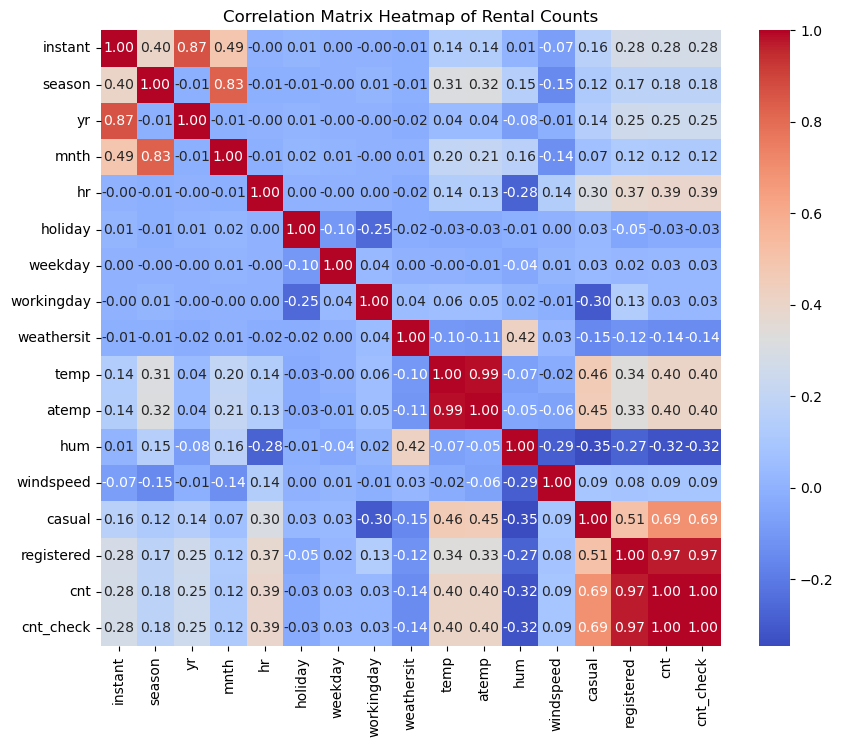

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Set the title
plt.title('Correlation Matrix Heatmap of Rental Counts')

# Show the plot
plt.show()


In [26]:
# exploring correlations between month and season 
month_season = data.groupby('mnth')['season'].unique().reset_index()
month_season 

,mnth,season
0,1,[1]
1,2,[1]
2,3,"[1, 2]"
3,4,[2]
4,5,[2]
5,6,"[2, 3]"
6,7,[3]
7,8,[3]
8,9,"[3, 4]"
9,10,[4]


In [27]:


# want to plot 2 different lines over time, comparing registered users and casual user counts 
registered_casual = data.groupby('dteday')[['registered', 'casual']].sum().reset_index()
fig6 = px.line(registered_casual, x='dteday', y=['registered', 'casual'], 
               labels={'dteday': 'Date', 'value': 'Count', 'variable': 'User Type'},
               title='Registered vs. Casual User Counts Over Time')

# Show the plot
fig6.show()


In [28]:
# smoothed version of graph above 

# Calculate rolling averages for registered and casual user counts
rolling_avg_registered = data['registered'].rolling(window=50, min_periods=1).median()
rolling_avg_casual = data['casual'].rolling(window=50, min_periods=1).median()

# Create a DataFrame for smoothed data
smoothed_data = data[['dteday']].copy()
smoothed_data['registered_smooth'] = rolling_avg_registered
smoothed_data['casual_smooth'] = rolling_avg_casual

# Plot the smoothed data
fig7 = px.line(smoothed_data, x='dteday', y=['registered_smooth', 'casual_smooth'], 
              labels={'dteday': 'Date', 'value': 'Count', 'variable': 'User Type'},
              title='Smoothed Registered vs. Casual User Counts Over Time')

# Show the plot
fig7.show()


In [29]:
# there seems to be a cyclical behavior in users over time per year

# group by day of the year and compare the two years
# extract just the day and month from dteday column to group by 
data['day_of_year'] = data['dteday'].dt.strftime('%m-%d')
# see the values 
data['day_of_year'].nunique()

366

In [30]:
# Group by day of year and year, and calculate total rental counts
rentals_by_year = data.groupby(['day_of_year', 'yr'])['cnt'].sum().reset_index()

# Plotting the rental counts for each day of the year, with colors indicating the years
fig = px.line(rentals_by_year, x='day_of_year', y='cnt', color='yr',
              labels={'day_of_year': 'Day of Year', 'cnt': 'Rental Count', 'yr': 'Year'},
              title='Total Rental Counts for Each Day of Year by Year')
# fix the x axis to be the same for both years
fig.update_xaxes(tick0=0, dtick=30)
fig.show()

In [31]:
# registered vs casual rental behaviors split across the hours 
hourly_registered_casual = data.groupby('hr')[['registered', 'casual']].median().reset_index()
# use as filled in line plot so the area below is shaded 
fig8 = px.line(hourly_registered_casual, x='hr', y=['registered', 'casual'], 
               labels={'hr': 'Hour of the Day', 'value': 'Count', 'variable': 'User Type'},
               title='Median Registered vs. Casual User Counts by Hour')
# label all hours 
fig8.update_xaxes(tick0=0, dtick=1)
# add the trendlines over the area plot for the registered vs casual users
fig8.add_traces(px.line(hourly_registered_casual, x='hr', y='registered').data)
fig8.show()

In [32]:
# scatter plot of temperature vs cnt 
fig9 = px.scatter(data, x='temp', y='cnt', 
                  labels={'temp': 'Temperature', 'cnt': 'Rental Count'},
                  title='Rental Count vs. Temperature')
fig9.show()

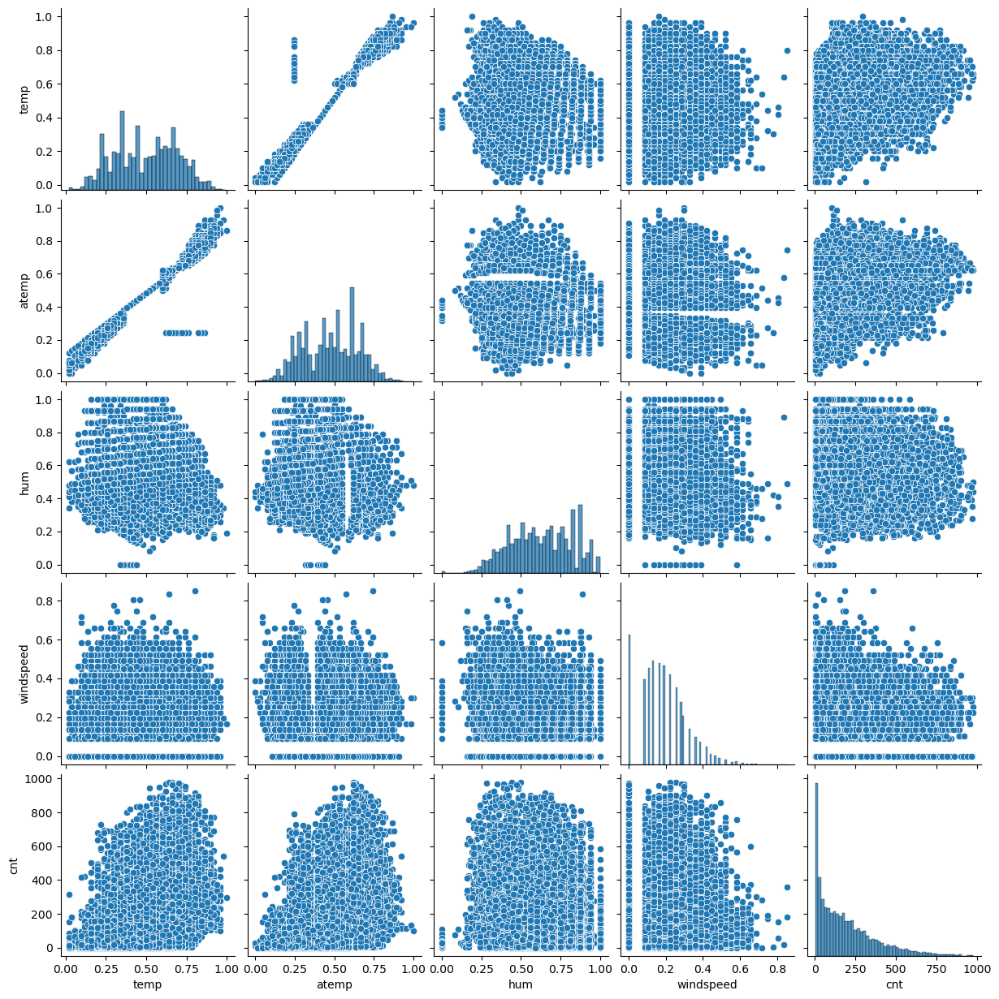

In [33]:
# Selecting features that make sense to the target variable 'cnt'
features = ['temp', 'atemp', 'hum', 'windspeed', 'cnt']

# Creating the scatter matrix
sns.pairplot(data[features])

# Show the plot
plt.show()


In [34]:
# distribution of cnt variable by season 
fig10 = px.box(data, x='season', y='cnt', 
               labels={'season': 'Season', 'cnt': 'Rental Count'},
               title='Rental Count Distribution by Season')
fig10.show()


In [35]:
#In the same plot, create a box-plot for the distribution of temp, atemp, hum, and windspeed for each season.

# is there a way to add the cnt to this graph to make it explain seasonality?
##################


# Create a new DataFrame for the box-plot
box_plot_data = data[['season', 'temp', 'atemp', 'hum', 'windspeed']].copy()

# Melt the DataFrame. Melting the dataframe means converting it from wide format to long format. This means that the columns are stacked on top of each other
box_plot_data = box_plot_data.melt(id_vars='season', value_vars=['temp', 'atemp', 'hum', 'windspeed'], 
                                   var_name='Variable', value_name='Value')

# Plot the box-plot
# map season names to box plot data
box_plot_data['season'] = box_plot_data['season'].map(season_names)
fig8 = px.box(box_plot_data, x='season', y='Value', color='Variable', 
              labels={'season': 'Season', 'Value': 'Value', 'Variable': 'Variable'},
              title='Distribution of Temperature, Feel Temperature, Humidity, and Windspeed by Season')

# Show the plot
fig8.show()

In [36]:
# plotting seasonal counts for bike rentals 
seasonal_counts = data.groupby(['season', 'hr'])['cnt'].mean().reset_index()
season_names = {
    1: 'Winter',
    2: 'Spring',
    3: 'Summer',
    4: 'Fall'
}
seasonal_counts['season'] = seasonal_counts['season'].map(season_names)
fig10 = px.line(seasonal_counts, x='hr', y='cnt', color='season',
                labels={'hr': 'Hour of the Day', 'cnt': 'Median Rental Count'},
                title='Hourly Rental Distribution by Season')
# show all of the x axis values 
fig10.update_xaxes(tick0=0, dtick=1)
fig10.show()


In [37]:
# plotting seasonal counts for bike rentals 
seasonal_counts = data.groupby(['season', 'weekday'])['cnt'].mean().reset_index()
season_names = {
    1: 'Winter',
    2: 'Spring',
    3: 'Summer',
    4: 'Fall'
}
seasonal_counts['season'] = seasonal_counts['season'].map(season_names)
fig10 = px.line(seasonal_counts, x='weekday', y='cnt', color='season',
                labels={'weekday': 'Day of the Week', 'cnt': 'Median Rental Count'},
                title='Hourly Rental Distribution by Season')
# show all of the x axis values 
fig10.update_xaxes(tick0=0, dtick=1)
fig10.show()


In [38]:
# scatter plot of windspeed as y axis vs cnt as x axis
fig11 = px.scatter(data, x='windspeed', y='cnt', 
                  labels={'windspeed': 'Windspeed', 'cnt': 'Rental Count'},
                  title='Rental Count vs. Windspeed')

# Show the plot
fig11.show()

In [39]:
# checking month vs cnt and graphing as histogram using plotly 

month_grouped = data.groupby('mnth')['cnt'].mean()

# season grouped and graphed as paired bar plot next to month 
season_grouped = data.groupby('season')['cnt'].mean()

# graph as histogram
px.bar(month_grouped)


In [40]:
# binning wind speed 
# Create a new column for the binned windspeed

# thresholds_by_quantiles = data['windspeed'].quantile([0, 0.33, 0.66, 1])

data['windspeed_binned'] = pd.cut(data['windspeed'], bins=[0, 0.33, 0.66, 1], labels=['Low Wind', 'Medium Wind', 'High Wind'], include_lowest=True)
data['windspeed_binned'].value_counts() 

Low Wind       15578
Medium Wind     1786
High Wind         15
Name: windspeed_binned, dtype: int64

In [41]:
# why are there nulls from my binned version of windspeed?
data['windspeed_binned'].isnull().sum()

0

In [42]:
import plotly.express as px 
# graph the windspeed_binned compared to the counts of bike rentals as a bar plot
# data grouped by windspeed_binned and the mean of the cnt column

grouped_windspeed = data.groupby('windspeed_binned')['cnt'].sum().reset_index()

fig12 = px.bar(grouped_windspeed, x='windspeed_binned', y='cnt', 
               labels={'windspeed_binned': 'Windspeed', 'cnt': 'Rental Count'},
               title='Rental Count by Windspeed Binned')
# fixing the color of the bars 
fig12.update_traces(marker_color='blue')
fig12.show()

In [43]:
# binning humidity by quantiles 
# Create a new column for the binned humidity
# hum_by_quantiles = data['hum'].quantile([0, 0.25, 0.75, 1])

data['hum_binned'] = pd.cut(data['hum'], bins=[0, 0.33, 0.66, 1], labels=['Low Humidity', 'Medium Humidity', 'High Humidity'], include_lowest=True)
data['hum_binned'].value_counts()

Medium Humidity    8645
High Humidity      7581
Low Humidity       1153
Name: hum_binned, dtype: int64

In [44]:
# graph the hum_binned compared to the counts of bike rentals as a bar plot
# data grouped by hum_binned and the mean of the cnt column

grouped_humidity = data.groupby('hum_binned')['cnt'].sum().reset_index()

fig12 = px.bar(grouped_humidity, x='hum_binned', y='cnt', 
               labels={'hum_binned': 'Humidity', 'cnt': 'Rental Count'},
               title='Rental Count by Humidity Binned')
# fixing the color of the bars 
fig12.update_traces(marker_color='blue')
fig12.show()

In [45]:
# Combine 'temp' and 'atemp' into a single feature
# We'll use a simple average of 'temp' and 'atemp' as they're both normalized
data['temp_combined'] = (data['temp'] + data['atemp']) / 2

# binning the temp_combined column
# Create a new column for the binned temperature
# temp_by_quantiles = data['temp_combined'].quantile([0, 0.25, 0.75, 1])

data['temp_binned'] = pd.cut(data['temp_combined'], bins=[0, 0.33, 0.66, 1], labels=['Low Temp', 'Medium Temp', 'High Temp'], include_lowest=True)
data['temp_binned'].value_counts()

Medium Temp    9671
Low Temp       4345
High Temp      3363
Name: temp_binned, dtype: int64

In [46]:
# graph the temp_binned compared to the counts of bike rentals as a bar plot
# data grouped by temp_binned and the mean of the cnt column

grouped_temp = data.groupby('temp_binned')['cnt'].sum().reset_index()

fig12 = px.bar(grouped_temp, x='temp_binned', y='cnt', 
               labels={'temp_binned': 'Temp', 'cnt': 'Rental Count'},
               title='Rental Count by Temp Binned')
# fixing the color of the bars 
fig12.update_traces(marker_color='blue')
fig12.show()

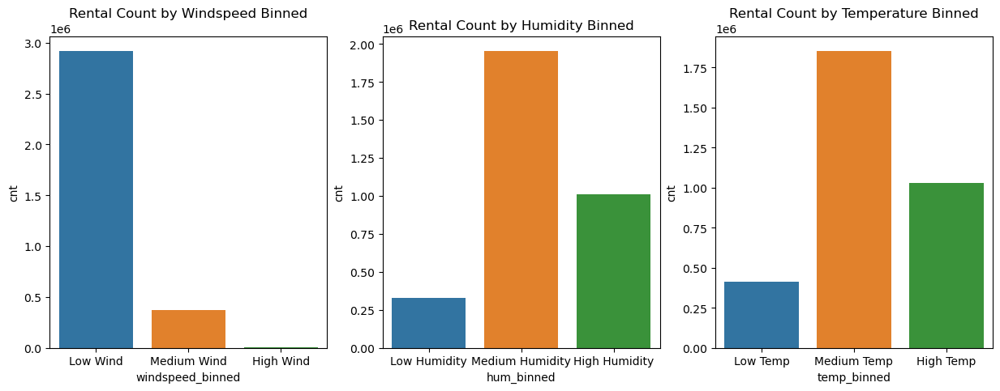

In [47]:
# plot the last 3 graphs in the same figure 
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Plot the windspeed binned
sns.barplot(data=grouped_windspeed, x='windspeed_binned', y='cnt', ax=ax[0])
ax[0].set_title('Rental Count by Windspeed Binned')

# Plot the humidity binned
sns.barplot(data=grouped_humidity, x='hum_binned', y='cnt', ax=ax[1])
ax[1].set_title('Rental Count by Humidity Binned')

# Plot the temperature binned
sns.barplot(data=grouped_temp, x='temp_binned', y='cnt', ax=ax[2])
ax[2].set_title('Rental Count by Temperature Binned')

# Show the plot
plt.show()

In [48]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots with one row and three columns
fig = make_subplots(rows=1, cols=3, subplot_titles=(' Count by Windspeed',
                                                    'Count by Humidity',
                                                    'Count by Temperature'))
                                                    # fixing the size of the titles for each graph)

# Plot the windspeed binned
fig.add_trace(go.Bar(x=grouped_windspeed['windspeed_binned'], y=grouped_windspeed['cnt'], 
                     name='Windspeed', marker_color='blue'), row=1, col=1)

# Plot the humidity binned
fig.add_trace(go.Bar(x=grouped_humidity['hum_binned'], y=grouped_humidity['cnt'], 
                     name='Humidity', marker_color='orange'), row=1, col=2)

# Plot the temperature binned
fig.add_trace(go.Bar(x=grouped_temp['temp_binned'], y=grouped_temp['cnt'], 
                     name='Temperature', marker_color='green'), row=1, col=3)

# Update layout
fig.update_layout(title='Rental Counts by Weather Factors', 
                  showlegend=False, 
                  height=500, 
                  width=900)

# UPDATE title text size to fit above the graphs
fig.update_layout(title_text='Rental Counts by Weather Factors', title_x=0.5)

# Show the plot
fig.show()


### Feature Engineering

In [49]:
# hours binned to create a new column called 'hour_bin'
hour_bins = [0, 6, 12, 18, 24]
bin_labels = ['Early Morning', 'Morning', 'Afternoon', 'Evening']

# Create the new column
data['hour_bin'] = pd.cut(data['hr'], bins=hour_bins, labels=bin_labels, right=False)
data[['hr', 'hour_bin']].head(10)

,hr,hour_bin
0,0,Early Morning
1,1,Early Morning
2,2,Early Morning
3,3,Early Morning
4,4,Early Morning
5,5,Early Morning
6,6,Morning
7,7,Morning
8,8,Morning
9,9,Morning


In [50]:
# dropping previously made column for the cnt_check 
# data = data.drop(columns='cnt_check')

In [51]:
# rush_hour feature indicating if the time of rental falls within the morning or afternoon peak hours
# rush hours are 8 and 17 
data['rush_hour'] = data['hr'].map({8: 1, 17: 1})
# fill other values with 0
data['rush_hour'] = data['rush_hour'].fillna(0)
data['rush_hour'].value_counts()

#cast it to integer
data['rush_hour'] = data['rush_hour'].astype(int)

In [52]:
# previous hour rentals for the day to find trends
data['prev_hour_rentals'] = data['cnt'].shift(1)
# fill na with avg of col
data['prev_hour_rentals'] = data['prev_hour_rentals'].fillna(data['prev_hour_rentals'].mean())

In [53]:
# perceived temperature difference 
data['temp_diff_perceived'] = data['atemp'] - data['temp']

In [54]:
import numpy as np

# Define a function to calculate weather condition intensity score
def calculate_weather_intensity(row):
    if row['weathersit'] == 1:  # Clear weather
        intensity = 0.1 * row['temp'] + 0.05 * row['hum'] + 0.05 * row['windspeed']
    elif row['weathersit'] == 2:  # Misty/cloudy weather
        intensity = 0.2 * row['temp'] + 0.1 * row['hum'] + 0.1 * row['windspeed']
    elif row['weathersit'] == 3:  # Light snow/rain weather
        intensity = 0.3 * row['temp'] + 0.15 * row['hum'] + 0.15 * row['windspeed']
    else:  # Heavy rain/snow/fog weather
        intensity = 0.4 * row['temp'] + 0.2 * row['hum'] + 0.2 * row['windspeed']
    return np.clip(intensity, 0, 1)  # Clip values to range [0, 1]

# Apply the function to create a new feature 'weather_intensity'
data['weather_intensity'] = data.apply(calculate_weather_intensity, axis=1)


In [55]:
# Define a function to calculate weather change indicator
def calculate_weather_change(row):
    # Define a threshold for significant weather change
    threshold = 0.1  # Adjust as needed based on your data and domain knowledge
    
    # Calculate absolute differences between consecutive values of weather-related features
    temp_change = abs(row['temp'] - row['temp_prev'])
    hum_change = abs(row['hum'] - row['hum_prev'])
    windspeed_change = abs(row['windspeed'] - row['windspeed_prev'])
    
    # Check if any of the changes exceed the threshold
    if temp_change > threshold or hum_change > threshold or windspeed_change > threshold:
        return 1  # Significant weather change
    else:
        return 0  # No significant weather change

# Shift weather-related features by one hour to get previous hour values
data[['temp_prev', 'hum_prev', 'windspeed_prev']] = data[['temp', 'hum', 'windspeed']].shift(1)

# Apply the function to create a new feature 'weather_change_indicator'
data['weather_change_indicator'] = data.apply(calculate_weather_change, axis=1)

# Fill missing values in the first row with 0 (assuming no significant weather change at the beginning)
data['weather_change_indicator'].fillna(0, inplace=True)


In [56]:
data.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt', 'cnt_check', 'day_of_year',
       'windspeed_binned', 'hum_binned', 'temp_combined', 'temp_binned',
       'hour_bin', 'rush_hour', 'prev_hour_rentals', 'temp_diff_perceived',
       'weather_intensity', 'temp_prev', 'hum_prev', 'windspeed_prev',
       'weather_change_indicator'],
      dtype='object')

In [57]:
# adding feature for the median of temp and atemp values 
data['temp_median'] = (data['temp'] + data['atemp']).mean()


In [58]:
# adding feature for the daily rentals for each record
data['daily_rentals'] = data['cnt'].rolling(window=24, min_periods=1).sum()


In [59]:
# fill Nans with average 
data['daily_rentals'] = data['daily_rentals'].fillna(data['daily_rentals'].mean())

In [60]:
# correlation matrix of all features compared to the target variable 'cnt'
data_for_correlation = data.select_dtypes(include=['int64', 'float64'])
correlation_matrix = data_for_correlation.corr()
correlation_matrix['cnt'].sort_values(ascending=False)

cnt_check                   1.000000
cnt                         1.000000
registered                  0.972151
prev_hour_rentals           0.843789
casual                      0.694564
daily_rentals               0.418812
temp                        0.404772
temp_combined               0.404204
atemp                       0.400929
temp_prev                   0.394955
hr                          0.394071
rush_hour                   0.368367
instant                     0.278379
yr                          0.250495
season                      0.178056
mnth                        0.120638
windspeed                   0.093234
windspeed_prev              0.085540
workingday                  0.030284
weekday                     0.026900
weather_change_indicator    0.023034
weather_intensity          -0.026188
holiday                    -0.030927
weathersit                 -0.142426
temp_diff_perceived        -0.256288
hum_prev                   -0.304080
hum                        -0.322911
t

In [61]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,...,rush_hour,prev_hour_rentals,temp_diff_perceived,weather_intensity,temp_prev,hum_prev,windspeed_prev,weather_change_indicator,temp_median,daily_rentals
0,1,2011-01-01,1,0,1,0,0,6,0,1,...,0,189.47117,0.0479,0.0645,NaN,NaN,NaN,0,0.972762,16.0
1,2,2011-01-01,1,0,1,1,0,6,0,1,...,0,16.00000,0.0527,0.0620,0.24,0.81,0.0,0,0.972762,56.0
2,3,2011-01-01,1,0,1,2,0,6,0,1,...,0,40.00000,0.0527,0.0620,0.22,0.80,0.0,0,0.972762,88.0
3,4,2011-01-01,1,0,1,3,0,6,0,1,...,0,32.00000,0.0479,0.0615,0.22,0.80,0.0,0,0.972762,101.0
4,5,2011-01-01,1,0,1,4,0,6,0,1,...,0,13.00000,0.0479,0.0615,0.24,0.75,0.0,0,0.972762,102.0


In [62]:
# instead of taking registered and casual as separate features, we can create the model to predict for them as well


In [63]:
data.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt', 'cnt_check', 'day_of_year',
       'windspeed_binned', 'hum_binned', 'temp_combined', 'temp_binned',
       'hour_bin', 'rush_hour', 'prev_hour_rentals', 'temp_diff_perceived',
       'weather_intensity', 'temp_prev', 'hum_prev', 'windspeed_prev',
       'weather_change_indicator', 'temp_median', 'daily_rentals'],
      dtype='object')

In [64]:
data['Weather Discomfort Index'] = (data['windspeed'] * data['hum']) / data['temp']


In [65]:
# checking correlations again 
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,...,prev_hour_rentals,temp_diff_perceived,weather_intensity,temp_prev,hum_prev,windspeed_prev,weather_change_indicator,temp_median,daily_rentals,Weather Discomfort Index
0,1,2011-01-01,1,0,1,0,0,6,0,1,...,189.47117,0.0479,0.0645,NaN,NaN,NaN,0,0.972762,16.0,0.0
1,2,2011-01-01,1,0,1,1,0,6,0,1,...,16.00000,0.0527,0.0620,0.24,0.81,0.0,0,0.972762,56.0,0.0
2,3,2011-01-01,1,0,1,2,0,6,0,1,...,40.00000,0.0527,0.0620,0.22,0.80,0.0,0,0.972762,88.0,0.0
3,4,2011-01-01,1,0,1,3,0,6,0,1,...,32.00000,0.0479,0.0615,0.22,0.80,0.0,0,0.972762,101.0,0.0
4,5,2011-01-01,1,0,1,4,0,6,0,1,...,13.00000,0.0479,0.0615,0.24,0.75,0.0,0,0.972762,102.0,0.0


In [66]:
# checking Nas
data.isnull().sum()

instant                     0
dteday                      0
season                      0
yr                          0
mnth                        0
hr                          0
holiday                     0
weekday                     0
workingday                  0
weathersit                  0
temp                        0
atemp                       0
hum                         0
windspeed                   0
casual                      0
registered                  0
cnt                         0
cnt_check                   0
day_of_year                 0
windspeed_binned            0
hum_binned                  0
temp_combined               0
temp_binned                 0
hour_bin                    0
rush_hour                   0
prev_hour_rentals           0
temp_diff_perceived         0
weather_intensity           0
temp_prev                   1
hum_prev                    1
windspeed_prev              1
weather_change_indicator    0
temp_median                 0
daily_rent

In [67]:
# filling temp_prev, hum_prev, windspeed_prev with the mean 
data['temp_prev'] = data['temp_prev'].fillna(data['temp_prev'].mean())
data['hum_prev'] = data['hum_prev'].fillna(data['hum_prev'].mean())
data['windspeed_prev'] = data['windspeed_prev'].fillna(data['windspeed_prev'].mean())

In [68]:
# check nulls again 
data.isnull().sum()

instant                     0
dteday                      0
season                      0
yr                          0
mnth                        0
hr                          0
holiday                     0
weekday                     0
workingday                  0
weathersit                  0
temp                        0
atemp                       0
hum                         0
windspeed                   0
casual                      0
registered                  0
cnt                         0
cnt_check                   0
day_of_year                 0
windspeed_binned            0
hum_binned                  0
temp_combined               0
temp_binned                 0
hour_bin                    0
rush_hour                   0
prev_hour_rentals           0
temp_diff_perceived         0
weather_intensity           0
temp_prev                   0
hum_prev                    0
windspeed_prev              0
weather_change_indicator    0
temp_median                 0
daily_rent

In [ ]:
data.to_csv('bike_sharing_modified.csv', index=False)

### Dimensionality Reduction: Selection 

- We will use SelectKBest method 

In [69]:
data = pd.read_csv('bike_sharing_modified.csv')
data.columns

Index(['dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt',
       'cnt_check', 'day_of_year', 'windspeed_binned', 'hum_binned',
       'temp_combined', 'temp_binned', 'hour_bin', 'rush_hour',
       'temp_diff_perceived', 'weather_intensity', 'temp_prev', 'hum_prev',
       'windspeed_prev', 'weather_change_indicator', 'temp_median',
       'daily_rentals', 'Weather Discomfort Index'],
      dtype='object')

In [70]:
data.drop(columns=['cnt_check','temp','atemp','dteday','day_of_year'],inplace=True)

In [71]:
x = data.copy().drop(["cnt"], axis=1) # features
y = data.loc[:, "cnt"] # target

In [72]:
x

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,hum,windspeed,...,rush_hour,temp_diff_perceived,weather_intensity,temp_prev,hum_prev,windspeed_prev,weather_change_indicator,temp_median,daily_rentals,Weather Discomfort Index
0,1,0,1,0,0,6,0,1,0.81,0.0000,...,0,0.0479,0.064500,0.497001,0.627228,0.190101,0,0.972762,16.0,0.000000
1,1,0,1,1,0,6,0,1,0.80,0.0000,...,0,0.0527,0.062000,0.240000,0.810000,0.000000,0,0.972762,56.0,0.000000
2,1,0,1,2,0,6,0,1,0.80,0.0000,...,0,0.0527,0.062000,0.220000,0.800000,0.000000,0,0.972762,88.0,0.000000
3,1,0,1,3,0,6,0,1,0.75,0.0000,...,0,0.0479,0.061500,0.220000,0.800000,0.000000,0,0.972762,101.0,0.000000
4,1,0,1,4,0,6,0,1,0.75,0.0000,...,0,0.0479,0.061500,0.240000,0.750000,0.000000,0,0.972762,102.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,1,12,19,0,1,1,2,0.60,0.1642,...,0,-0.0024,0.128420,0.260000,0.480000,0.134300,1,0.972762,2644.0,0.378923
17375,1,1,12,20,0,1,1,2,0.60,0.1642,...,0,-0.0024,0.128420,0.260000,0.600000,0.164200,0,0.972762,2661.0,0.378923
17376,1,1,12,21,0,1,1,1,0.60,0.1642,...,0,-0.0024,0.064210,0.260000,0.600000,0.164200,0,0.972762,2704.0,0.378923
17377,1,1,12,22,0,1,1,1,0.56,0.1343,...,0,0.0127,0.060715,0.260000,0.600000,0.164200,0,0.972762,2729.0,0.289262


In [73]:
categorical_features = x.select_dtypes(include=["O"])
discrete_features = x.select_dtypes(include=["int64"])
continuous_features = x.select_dtypes(include=["float64"])

In [74]:
continuous_features

,hum,windspeed,temp_combined,temp_diff_perceived,weather_intensity,temp_prev,hum_prev,windspeed_prev,temp_median,daily_rentals,Weather Discomfort Index
0,0.81,0.0000,0.26395,0.0479,0.064500,0.497001,0.627228,0.190101,0.972762,16.0,0.000000
1,0.80,0.0000,0.24635,0.0527,0.062000,0.240000,0.810000,0.000000,0.972762,56.0,0.000000
2,0.80,0.0000,0.24635,0.0527,0.062000,0.220000,0.800000,0.000000,0.972762,88.0,0.000000
3,0.75,0.0000,0.26395,0.0479,0.061500,0.220000,0.800000,0.000000,0.972762,101.0,0.000000
4,0.75,0.0000,0.26395,0.0479,0.061500,0.240000,0.750000,0.000000,0.972762,102.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
17374,0.60,0.1642,0.25880,-0.0024,0.128420,0.260000,0.480000,0.134300,0.972762,2644.0,0.378923
17375,0.60,0.1642,0.25880,-0.0024,0.128420,0.260000,0.600000,0.164200,0.972762,2661.0,0.378923
17376,0.60,0.1642,0.25880,-0.0024,0.064210,0.260000,0.600000,0.164200,0.972762,2704.0,0.378923
17377,0.56,0.1343,0.26635,0.0127,0.060715,0.260000,0.600000,0.164200,0.972762,2729.0,0.289262


In [75]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, chi2, f_regression

cat_pipe = Pipeline([
    ('imputer',SimpleImputer(strategy='most_frequent')),
    ('label', OrdinalEncoder())
    
])

disc_pipe = Pipeline([

    ('imputer',SimpleImputer(strategy='median')),
])

disc_transformer = ColumnTransformer([
    ("cat", cat_pipe, categorical_features.columns ),
    ('disc', disc_pipe, discrete_features.columns ),

],
remainder="drop")

#disc_transformer.fit(x)

discrete_selector = Pipeline([
     ('disc_transformer', disc_transformer),
     ('selector',SelectKBest(chi2,k=8))

 ])



continuous_selector = Pipeline([    
    ('scaler', MinMaxScaler()),
    ('selector',SelectKBest(f_regression,k=8))
])

selector = ColumnTransformer([
    ('discrete_selector', discrete_selector, pd.concat([discrete_features,categorical_features],axis=1).columns),
    ('continuous_selector', continuous_selector, continuous_features.columns),
])


selector.fit(x,y)


ColumnTransformer(transformers=[('discrete_selector',
                                 Pipeline(steps=[('disc_transformer',
                                                  ColumnTransformer(transformers=[('cat',
                                                                                   Pipeline(steps=[('imputer',
                                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                                   ('label',
                                                                                                    OrdinalEncoder())]),
                                                                                   Index(['windspeed_binned', 'hum_binned', 'temp_binned', 'hour_bin'], dtype='object')),
                                                                                  ('disc',
                                                                                   Pipeline(steps=[('imputer',
                                                                                                    SimpleIm...
      dtype='object')),
                                ('continuous_selector',
                                 Pipeline(steps=[('scaler', MinMaxScaler()),
                                                 ('selector',
                                                  SelectKBest(k=8,
                                                              score_func=<function f_regression at 0x145721800>))]),
                                 Index(['hum', 'windspeed', 'temp_combined', 'temp_diff_perceived',
       'weather_intensity', 'temp_prev', 'hum_prev', 'windspeed_prev',
       'temp_median', 'daily_rentals', 'Weather Discomfort Index'],
      dtype='object'))])

In [76]:
selector.fit_transform(x,y)

array([[0.        , 1.        , 1.        , ..., 0.62722753, 0.        ,
        0.        ],
       [0.        , 1.        , 1.        , ..., 0.81      , 0.00436491,
        0.        ],
       [0.        , 1.        , 1.        , ..., 0.8       , 0.00785683,
        0.        ],
       ...,
       [2.        , 2.        , 1.        , ..., 0.6       , 0.29332169,
        0.05244755],
       [2.        , 2.        , 1.        , ..., 0.6       , 0.29604976,
        0.04003731],
       [2.        , 2.        , 1.        , ..., 0.56      , 0.29604976,
        0.04647187]])

In [77]:
selector.get_feature_names_out()

array(['discrete_selector__cat__hum_binned',
       'discrete_selector__cat__hour_bin',
       'discrete_selector__disc__season', 'discrete_selector__disc__yr',
       'discrete_selector__disc__mnth', 'discrete_selector__disc__hr',
       'discrete_selector__disc__weekday',
       'discrete_selector__disc__rush_hour', 'continuous_selector__hum',
       'continuous_selector__windspeed',
       'continuous_selector__temp_combined',
       'continuous_selector__temp_diff_perceived',
       'continuous_selector__temp_prev', 'continuous_selector__hum_prev',
       'continuous_selector__daily_rentals',
       'continuous_selector__Weather Discomfort Index'], dtype=object)

In [78]:
selected_data = pd.DataFrame(selector.fit_transform(x,y), columns=selector.get_feature_names_out())

selected_data.columns = [col.split('__')[2] if (col.split('__')[1] == 'cat') or (col.split('__')[1] == 'disc')  else col.split('__')[1]for col in selected_data.columns]

selected_data

,hum_binned,hour_bin,season,yr,mnth,hr,weekday,rush_hour,hum,windspeed,temp_combined,temp_diff_perceived,temp_prev,hum_prev,daily_rentals,Weather Discomfort Index
0,0.0,1.0,1.0,0.0,1.0,0.0,6.0,0.0,0.81,0.000000,0.261804,0.925849,0.486736,0.627228,0.000000,0.000000
1,0.0,1.0,1.0,0.0,1.0,1.0,6.0,0.0,0.80,0.000000,0.243660,0.932526,0.224490,0.810000,0.004365,0.000000
2,0.0,1.0,1.0,0.0,1.0,2.0,6.0,0.0,0.80,0.000000,0.243660,0.932526,0.204082,0.800000,0.007857,0.000000
3,0.0,1.0,1.0,0.0,1.0,3.0,6.0,0.0,0.75,0.000000,0.261804,0.925849,0.204082,0.800000,0.009275,0.000000
4,0.0,1.0,1.0,0.0,1.0,4.0,6.0,0.0,0.75,0.000000,0.261804,0.925849,0.224490,0.750000,0.009385,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,2.0,2.0,1.0,1.0,12.0,19.0,1.0,0.0,0.60,0.193018,0.256495,0.855871,0.244898,0.480000,0.286774,0.052448
17375,2.0,2.0,1.0,1.0,12.0,20.0,1.0,0.0,0.60,0.193018,0.256495,0.855871,0.244898,0.600000,0.288629,0.052448
17376,2.0,2.0,1.0,1.0,12.0,21.0,1.0,0.0,0.60,0.193018,0.256495,0.855871,0.244898,0.600000,0.293322,0.052448
17377,2.0,2.0,1.0,1.0,12.0,22.0,1.0,0.0,0.56,0.157870,0.264278,0.876878,0.244898,0.600000,0.296050,0.040037


In [79]:
final_data = data[selected_data.columns]
final_data

,hum_binned,hour_bin,season,yr,mnth,hr,weekday,rush_hour,hum,windspeed,temp_combined,temp_diff_perceived,temp_prev,hum_prev,daily_rentals,Weather Discomfort Index
0,High Humidity,Early Morning,1,0,1,0,6,0,0.81,0.0000,0.26395,0.0479,0.497001,0.627228,16.0,0.000000
1,High Humidity,Early Morning,1,0,1,1,6,0,0.80,0.0000,0.24635,0.0527,0.240000,0.810000,56.0,0.000000
2,High Humidity,Early Morning,1,0,1,2,6,0,0.80,0.0000,0.24635,0.0527,0.220000,0.800000,88.0,0.000000
3,High Humidity,Early Morning,1,0,1,3,6,0,0.75,0.0000,0.26395,0.0479,0.220000,0.800000,101.0,0.000000
4,High Humidity,Early Morning,1,0,1,4,6,0,0.75,0.0000,0.26395,0.0479,0.240000,0.750000,102.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,Medium Humidity,Evening,1,1,12,19,1,0,0.60,0.1642,0.25880,-0.0024,0.260000,0.480000,2644.0,0.378923
17375,Medium Humidity,Evening,1,1,12,20,1,0,0.60,0.1642,0.25880,-0.0024,0.260000,0.600000,2661.0,0.378923
17376,Medium Humidity,Evening,1,1,12,21,1,0,0.60,0.1642,0.25880,-0.0024,0.260000,0.600000,2704.0,0.378923
17377,Medium Humidity,Evening,1,1,12,22,1,0,0.56,0.1343,0.26635,0.0127,0.260000,0.600000,2729.0,0.289262


In [80]:
final_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   hum_binned                17379 non-null  object 
 1   hour_bin                  17379 non-null  object 
 2   season                    17379 non-null  int64  
 3   yr                        17379 non-null  int64  
 4   mnth                      17379 non-null  int64  
 5   hr                        17379 non-null  int64  
 6   weekday                   17379 non-null  int64  
 7   rush_hour                 17379 non-null  int64  
 8   hum                       17379 non-null  float64
 9   windspeed                 17379 non-null  float64
 10  temp_combined             17379 non-null  float64
 11  temp_diff_perceived       17379 non-null  float64
 12  temp_prev                 17379 non-null  float64
 13  hum_prev                  17379 non-null  float64
 14  daily_

In [81]:
# Define the features and the target variable
X = final_data
y = data['cnt']

#define continuous and numerical data

num_feat = X.select_dtypes(include=['float64','int64'])
cat_feat = X.select_dtypes(include=['object'])


# Create pipelines for both numeric and categorical data
numeric_transformer = Pipeline(steps=[
    ('scaler', MinMaxScaler())])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine both transformers into a preprocessor using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_feat.columns),
        ('cat', categorical_transformer, cat_feat.columns)])




## PART II: Prediction Model

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Step 1: Preprocessing
preprocessor = preprocessor

# Step 2: Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Training the random forest regressor
regressor = RandomForestRegressor()

# Build the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', regressor)
])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Step 4: Scoring the model

# Predict the target variable on the testing data
y_pred = pipeline.predict(X_test)

# Calculate the R^2 score
r2 = pipeline.score(X_test, y_test)

print(f"The model has an R^2 score of {r2:.2f} on the testing data")



The model has an R^2 score of 0.93 on the testing data


In [83]:
# Grid search
from sklearn.model_selection import GridSearchCV

# Parameter grid for RandomForestRegressor
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Create a base model
rf = RandomForestRegressor(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')


# Apply the preprocessing to the X data
X_preprocessed = preprocessor.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_

print("Best parameters found: ", best_params)




Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   6.7s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   6.7s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   6.7s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   6.0s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   6.0s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  13.7s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  13.8s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total tim

In [84]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd

# # Use the best parameters to fit a new random forest model
best_rf_model = RandomForestRegressor(**best_params, random_state=42)

# # Fit the best model to the training data
best_rf_model.fit(X_train, y_train)

# # Predict on the test set with the best model
y_pred_best = best_rf_model.predict(X_test)

# # Evaluate the best model
mse_best = mean_squared_error(y_test, y_pred_best)
rmse_best = mse_best**0.5
mae_best = mean_absolute_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)

# # Output the evaluation metrics for the best model
print(f"Best model's evaluation metrics:")
print(f'Mean Squared Error: {mse_best}')
print(f'Root Mean Squared Error: {rmse_best}')
print(f'Mean Absolute Error: {mae_best}')
print(f'R^2 Score: {r2_best}')

Best model's evaluation metrics:
Mean Squared Error: 2321.73087377733
Root Mean Squared Error: 48.18434262057884
Mean Absolute Error: 27.925569620253164
R^2 Score: 0.9266792763527345


In [85]:
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd

# Step 1: Preprocessing
preprocessor = preprocessor

# Step 2: Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Training the random forest regressor
regressor = LGBMRegressor()

# Build the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', regressor)
])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Step 4: Scoring the model

# Predict the target variable on the testing data
y_pred = pipeline.predict(X_test)

# Calculate the R^2 score
r2 = pipeline.score(X_test, y_test)

print(f"The model has an R^2 score of {r2:.2f} on the testing data")



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1227
[LightGBM] [Info] Number of data points in the train set: 13903, number of used features: 21
[LightGBM] [Info] Start training from score 190.577070
The model has an R^2 score of 0.93 on the testing data


In [86]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {
    'num_leaves': [31, 50, 100],  # Number of leaves in full tree
    'max_depth': [-1, 5, 10],  # Maximum tree depth for base learners, -1 means no limit
    'learning_rate': [0.1, 0.05, 0.01],  # Boosting learning rate
    'n_estimators': [100, 200, 500]  # Number of boosted trees to fit
}

#Apply the preprocessing to the X data

X_preprocessed = preprocessor.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

# Create a base model
lgbm = LGBMRegressor()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters found: ", grid_search.best_params_)
print("Best score (neg_mean_squared_error): ", grid_search.best_score_)

# Use the best estimator to make predictions
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Evaluate the best model
mse = mean_squared_error(y_test, y_pred)
rmse = mse**0.5
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'\nEvaluation Metrics for Optimized LightGBM Regressor:')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
print(f'R^2 Score: {r2}')

Fitting 3 folds for each of 81 candidates, totalling 243 fits


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 9269, number of used features: 21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1206
[LightGBM] [Info] Number of data points in the train set: 9269, number of used features: 21
[LightGBM] [Info] Number of data points in the train set: 9269, number of used features: 21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead o